# Catalyst.jl tests

In [2]:
using Catalyst, Plots, StochasticDiffEq, DiffEqJump

rs = @reaction_network begin
  c1, S + E --> SE
  c2, SE --> S + E
  c3, SE --> P + E
end c1 c2 c3
p = (0.00166,0.0001,0.1)   # [c1,c2,c3]
tspan = (0., 100.)
u0 = [301., 100., 0., 0.]  # [S,E,SE,P]

# solve JumpProblem
dprob = DiscreteProblem(rs, u0, tspan, p)
jprob = JumpProblem(rs, dprob, Direct())
jsol = solve(jprob, SSAStepper())
plot(jsol,lw=2,title="Gillespie: Michaelis-Menten Enzyme Kinetics")

In [6]:
using Latexify

repressilator = @reaction_network begin
    hillr(P₃,α,K,n), ∅ --> m₁
    hillr(P₁,α,K,n), ∅ --> m₂
    hillr(P₂,α,K,n), ∅ --> m₃
    (δ,γ), m₁ ↔ ∅
    (δ,γ), m₂ ↔ ∅
    (δ,γ), m₃ ↔ ∅
    β, m₁ --> m₁ + P₁
    β, m₂ --> m₂ + P₂
    β, m₃ --> m₃ + P₃
    μ, P₁ --> ∅
    μ, P₂ --> ∅
    μ, P₃ --> ∅
end α K n δ γ β μ;

latexify(repressilator)

L"\begin{align}
\require{mhchem}
\ce{ \varnothing &->[\alpha K^{n} \mathrm{inv}\left( K^{n} + \left( \mathrm{P{_3}}\left( t \right) \right)^{n} \right)] m{_1}}\\
\ce{ \varnothing &->[\alpha K^{n} \mathrm{inv}\left( K^{n} + \left( \mathrm{P{_1}}\left( t \right) \right)^{n} \right)] m{_2}}\\
\ce{ \varnothing &->[\alpha K^{n} \mathrm{inv}\left( K^{n} + \left( \mathrm{P{_2}}\left( t \right) \right)^{n} \right)] m{_3}}\\
\ce{ m{_1} &<=>[\delta][\gamma] \varnothing}\\
\ce{ m{_2} &<=>[\delta][\gamma] \varnothing}\\
\ce{ m{_3} &<=>[\delta][\gamma] \varnothing}\\
\ce{ m{_1} &->[\beta] m{_1} + P{_1}}\\
\ce{ m{_2} &->[\beta] m{_2} + P{_2}}\\
\ce{ m{_3} &->[\beta] m{_3} + P{_3}}\\
\ce{ P{_1} &->[\mu] \varnothing}\\
\ce{ P{_2} &->[\mu] \varnothing}\\
\ce{ P{_3} &->[\mu] \varnothing}
\end{align}
"

In [7]:
# convert the rate laws to odes
odesys = convert(ODESystem, repressilator)
latexify(odesys)

L"\begin{align}
\frac{dm{_1}(t)}{dt} =& \gamma + \alpha K^{n} \left( K^{n} + \left( \mathrm{P{_3}}\left( t \right) \right)^{n} \right)^{-1} -1 \delta \mathrm{m{_1}}\left( t \right) \\
\frac{dm{_2}(t)}{dt} =& \gamma + \alpha K^{n} \left( K^{n} + \left( \mathrm{P{_1}}\left( t \right) \right)^{n} \right)^{-1} -1 \delta \mathrm{m{_2}}\left( t \right) \\
\frac{dm{_3}(t)}{dt} =& \gamma + \alpha K^{n} \left( K^{n} + \left( \mathrm{P{_2}}\left( t \right) \right)^{n} \right)^{-1} -1 \delta \mathrm{m{_3}}\left( t \right) \\
\frac{dP{_1}(t)}{dt} =& \beta \mathrm{m{_1}}\left( t \right) -1 \mu \mathrm{P{_1}}\left( t \right) \\
\frac{dP{_2}(t)}{dt} =& \beta \mathrm{m{_2}}\left( t \right) -1 \mu \mathrm{P{_2}}\left( t \right) \\
\frac{dP{_3}(t)}{dt} =& \beta \mathrm{m{_3}}\left( t \right) -1 \mu \mathrm{P{_3}}\left( t \right)
\end{align}
"

In [9]:
speciesmap(repressilator)
paramsmap(repressilator)

Dict{Sym{ModelingToolkit.Parameter{Real},Nothing},Int64} with 7 entries:
  α => 1
  μ => 7
  n => 3
  β => 6
  δ => 4
  γ => 5
  K => 2

In [10]:
# parameters [α,K,n,δ,γ,β,μ]
p = (.5, 40, 2, log(2)/120, 5e-3, 20*log(2)/120, log(2)/60)
# δ = ln(2)/120 means the t_1/2 of m degradation is 120

# initial condition [m₁,m₂,m₃,P₁,P₂,P₃]
u₀ = [0.,0.,0.,20.,0.,0.]

# time interval to solve on
tspan = (0., 10000.)

# create the ODEProblem we want to solve
oprob = ODEProblem(repressilator, u₀, tspan, p)

ODEProblem with uType Array{Float64,1} and tType Float64. In-place: true
timespan: (0.0, 10000.0)
u0: [0.0, 0.0, 0.0, 20.0, 0.0, 0.0]

┌ Info: Precompiling DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa]
└ @ Base loading.jl:1278


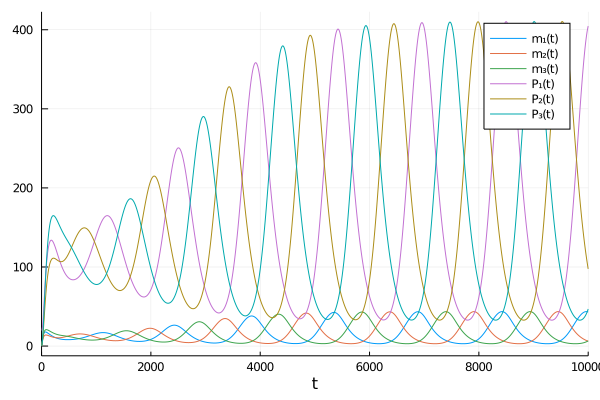

In [12]:
using DifferentialEquations

sol = solve(oprob, Tsit5(), saveat=10.)
plot(sol)

In [13]:
# redefine the initial condition to be integer valued
u₀ = [0,0,0,20,0,0]

# next we create a discrete problem to encode that our species are integer valued:
dprob = DiscreteProblem(repressilator, u₀, tspan, p)

# now, we create a JumpProblem, and specify Gillespie's Direct Method as the solver:
jprob = JumpProblem(repressilator, dprob, Direct(), save_positions=(false,false))
# this is an additional step only for a Gillespie's process
# but not for ODE (I guess not for SDE either)

JumpProblem with problem DiscreteProblem and aggregator Direct
Number of constant rate jumps: 3
Number of variable rate jumps: 0
Have a mass action jump


In [15]:
# now, let's solve and plot the jump process:
sol = solve(jprob, SSAStepper(), saveat=10.)
plot(sol)

In [17]:
# it's not a good idea to use SDE (CLE) for the repressilator
# since SDE can make near-zero values negative?

# create a SDE problem
u₀ = [0.,0.,0.,20.,0.,0.]    # initial condition
sprob = SDEProblem(repressilator, u₀, tspan, p)

sol = solve(sprob, LambaEM(), tstops=range(0., step=4e-3, length=1001))
plot(sol)

┌ Warning: dt <= dtmin. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:345


In [20]:
# A birth-death process with SDE

bdp = @reaction_network begin
  c₁, X --> 2X
  c₂, X --> 0
  c₃, 0 --> X
end c₁ c₂ c₃

latexify(convert(SDESystem, bdp))

L"\begin{align}
\frac{dX(t)}{dt} =& c{_3} + c{_1} X\left( t \right) -1 c{_2} X\left( t \right)
\end{align}
"

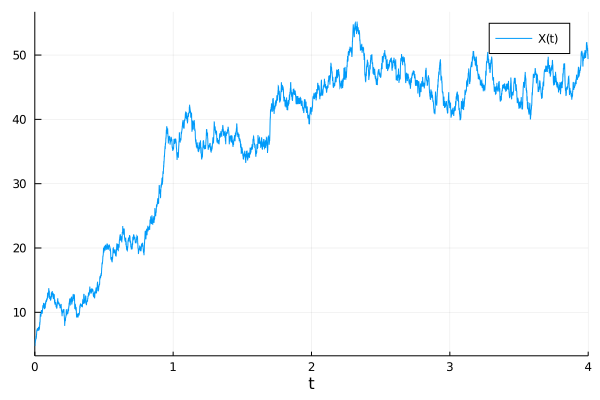

In [19]:
p = (1.0,2.0,50.)
u₀ = [5.]
tspan = (0.,4.)

bd_sprob = SDEProblem(bdp, u₀, tspan, p)

sol = solve(bd_sprob, LambaEM(), tstops=range(0., step=4e-3, length=1001))
plot(sol)